In [1]:
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import model as modellib
import pandas as pd
import cv2
import numpy as np
from inference_config import inference_config
from bowl_dataset import BowlDataset
import visualize
import matplotlib.pyplot as plt

%matplotlib inline

/glob/intel-python/versions/2018u2/intelpython3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.



Configurations:
BACKBONE_SHAPES                [[128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]
 [  8   8]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
DETECTION_MAX_INSTANCES        512
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  512
IMAGE_MIN_DIM                  512
IMAGE_PADDING                  True
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.0001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               256
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           bowl
NUM_CLASSES                    2
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRAINING         

In [2]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [21]:
ROOT_DIR = os.getcwd()
MODEL_DIR = os.path.join(ROOT_DIR, "model/checkpoint/")
print (MODEL_DIR)

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(MODEL_DIR, "RCNN_checkpoint.h5")
# model_path = model.find_last()[1]

print (model_path)

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

/home/u12162/model/checkpoint/
/home/u12162/model/checkpoint/RCNN_checkpoint.h5
Loading weights from  /home/u12162/model/checkpoint/RCNN_checkpoint.h5


In [25]:
TEST_DIR = './data/test/'

dataset_test = BowlDataset()
dataset_test.load_bowl(TEST_DIR)
dataset_test.prepare()

In [17]:
sample_submission = pd.read_csv('./stage1_sample_submission.csv')

In [19]:
print (sample_submission)

                                              ImageId EncodedPixels
0   0114f484a16c152baa2d82fdd43740880a762c93f436c8...           1 1
1   0999dab07b11bc85fb8464fc36c947fbd8b5d6ec498173...           1 1
2   0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed3...           1 1
3   0e132f71c8b4875c3c2dd7a22997468a3e842b46aa9bd4...           1 1
4   0ed3555a4bd48046d3b63d8baf03a5aa97e523aa483aaa...           1 1
5   0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c0...           1 1
6   1747f62148a919c8feb6d607faeebdf504b5e2ad42b6b1...           1 1
7   17b9bf4356db24967c4677b8376ac38f826de73a88b93a...           1 1
8   1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c...           1 1
9   191b2b2205f2f5cc9da04702c5d422bc249faf8bca1107...           1 1
10  1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e...           1 1
11  1cdbfee1951356e7b0a215073828695fe1ead5f8b1add1...           1 1
12  1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6...           1 1
13  1ef68e93964c2d9230100c1347c328f6385a7bc02787

./data/test/0114f484a16c152baa2d82fdd43740880a762c93f436c8988ac461c5c9dbe7d5/images/0114f484a16c152baa2d82fdd43740880a762c93f436c8988ac461c5c9dbe7d5.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   79.00000
molded_images            shape: (1, 512, 512, 3)      min: -121.70000  max:  -25.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


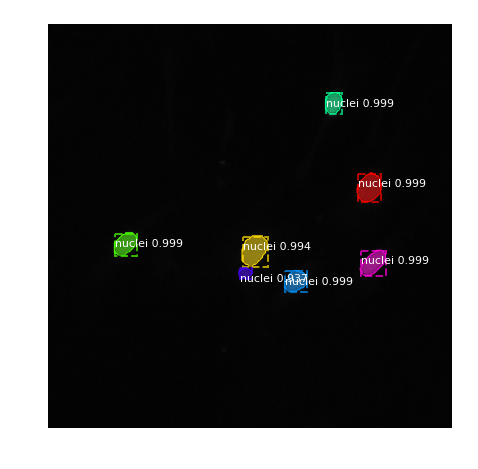

./data/test/0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac/images/0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac.png
Processing 1 images
image                    shape: (519, 253, 3)         min:   11.00000  max:  242.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  137.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


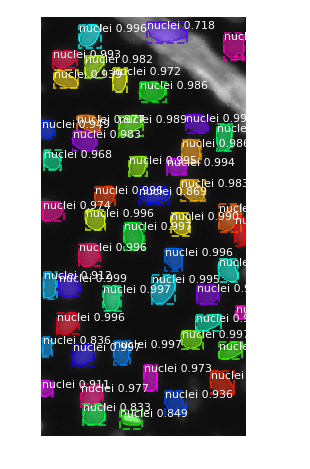

./data/test/0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732/images/0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


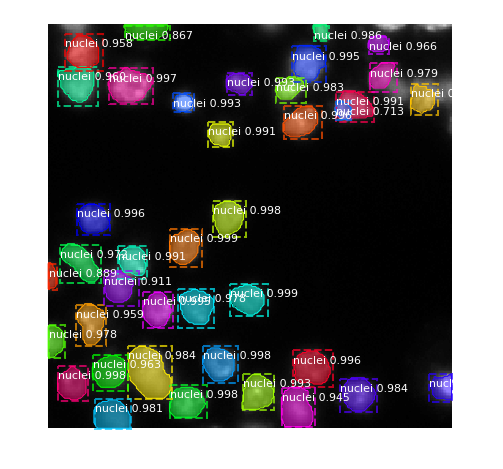

./data/test/0e132f71c8b4875c3c2dd7a22997468a3e842b46aa9bd47cf7b0e8b7d63f0925/images/0e132f71c8b4875c3c2dd7a22997468a3e842b46aa9bd47cf7b0e8b7d63f0925.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


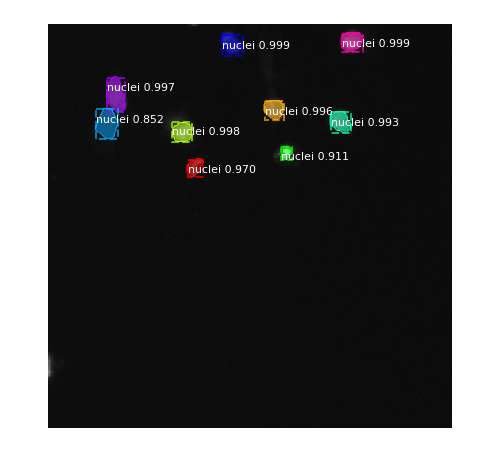

./data/test/0ed3555a4bd48046d3b63d8baf03a5aa97e523aa483aaa07459e7afa39fb96c6/images/0ed3555a4bd48046d3b63d8baf03a5aa97e523aa483aaa07459e7afa39fb96c6.png
Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -112.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


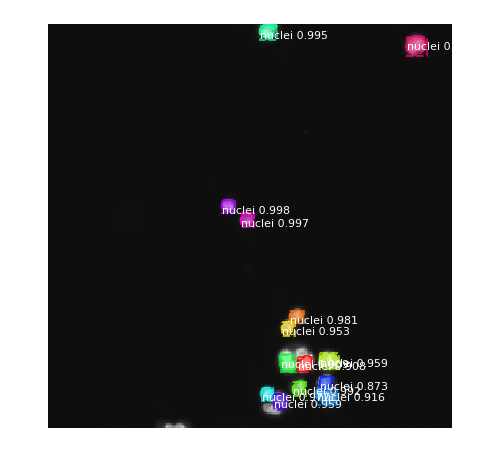

./data/test/0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466/images/0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466.png
Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


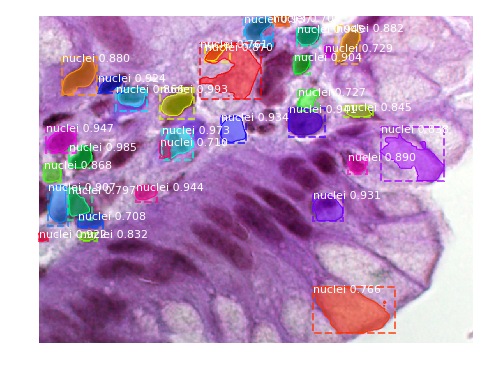

./data/test/1747f62148a919c8feb6d607faeebdf504b5e2ad42b6b1710b1189c37ebcdb2c/images/1747f62148a919c8feb6d607faeebdf504b5e2ad42b6b1710b1189c37ebcdb2c.png
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  192.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   65.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


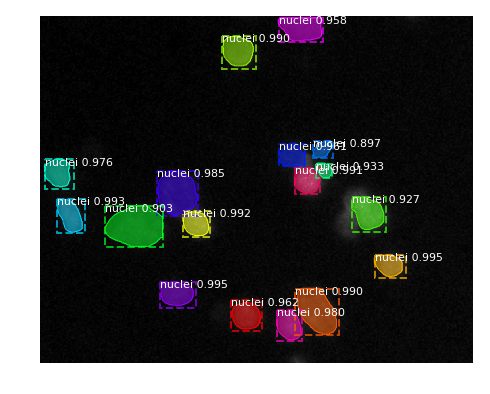

./data/test/17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff/images/17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff.png
Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  148.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


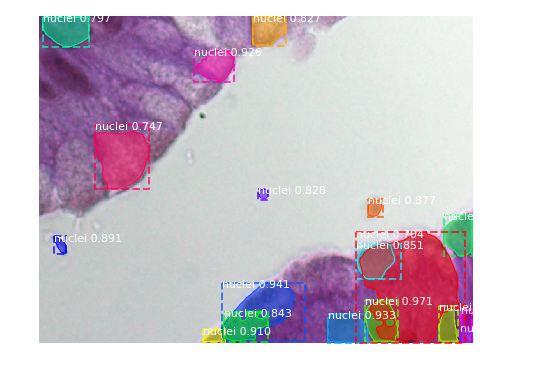

./data/test/1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c3e216a69653495153b/images/1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c3e216a69653495153b.png
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:   76.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  -31.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


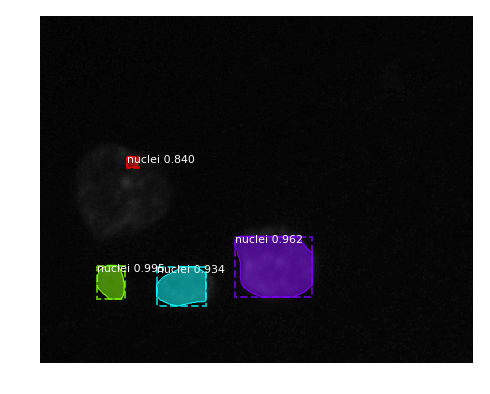

./data/test/191b2b2205f2f5cc9da04702c5d422bc249faf8bca1107af792da63cccfba829/images/191b2b2205f2f5cc9da04702c5d422bc249faf8bca1107af792da63cccfba829.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  108.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:    1.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


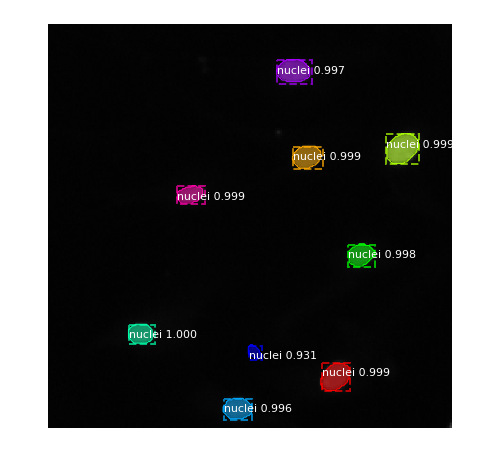

./data/test/1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a/images/1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a.png
Processing 1 images
image                    shape: (519, 162, 3)         min:    1.00000  max:  205.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   96.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


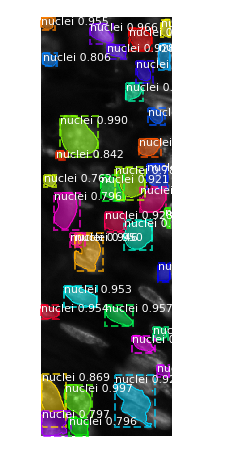

./data/test/1cdbfee1951356e7b0a215073828695fe1ead5f8b1add119b6645d2fdc8d844e/images/1cdbfee1951356e7b0a215073828695fe1ead5f8b1add119b6645d2fdc8d844e.png
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  126.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   10.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


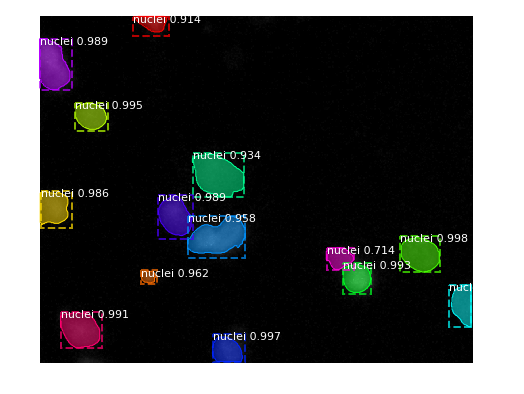

./data/test/1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1/images/1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1.png
Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


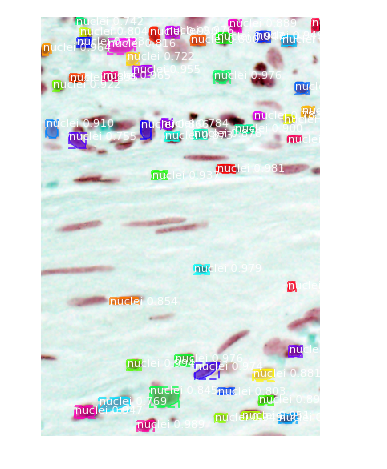

./data/test/1ef68e93964c2d9230100c1347c328f6385a7bc027879dc3d4c055e6fe80cb3c/images/1ef68e93964c2d9230100c1347c328f6385a7bc027879dc3d4c055e6fe80cb3c.png
Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -112.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


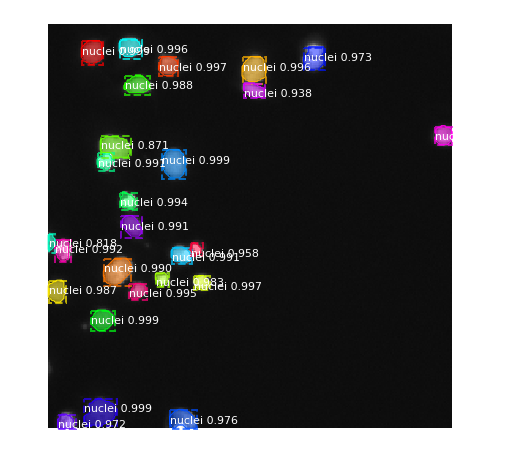

./data/test/259b35151d4a7a5ffdd7ab7f171b142db8cfe40beeee67277fac6adca4d042c4/images/259b35151d4a7a5ffdd7ab7f171b142db8cfe40beeee67277fac6adca4d042c4.png
Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  148.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


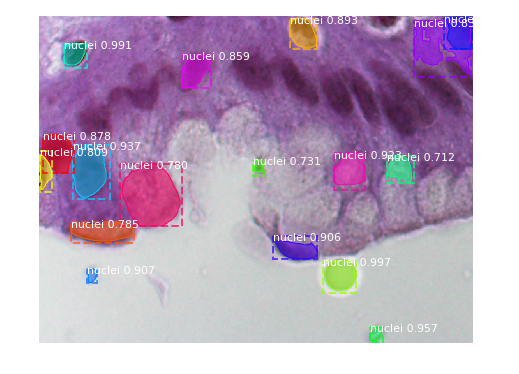

./data/test/295682d9eb5acb5c1976a460c085734bfaf38482b0a3f02591c2bfdcd4128549/images/295682d9eb5acb5c1976a460c085734bfaf38482b0a3f02591c2bfdcd4128549.png
Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -112.70000  max:  144.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


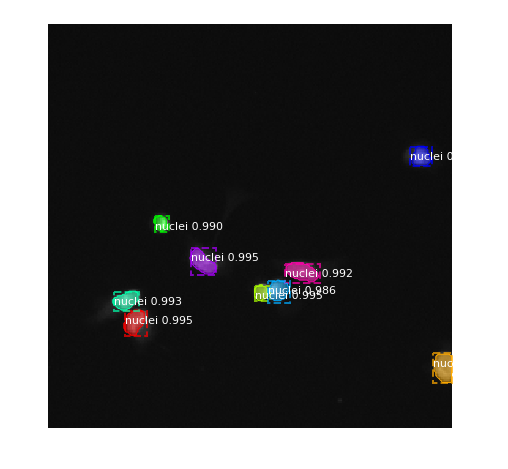

./data/test/31f1fbe85b8899258ea5bcf5f93f7ac8238660c386aeab40649c715bd2e38a0a/images/31f1fbe85b8899258ea5bcf5f93f7ac8238660c386aeab40649c715bd2e38a0a.png
Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -112.70000  max:  146.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


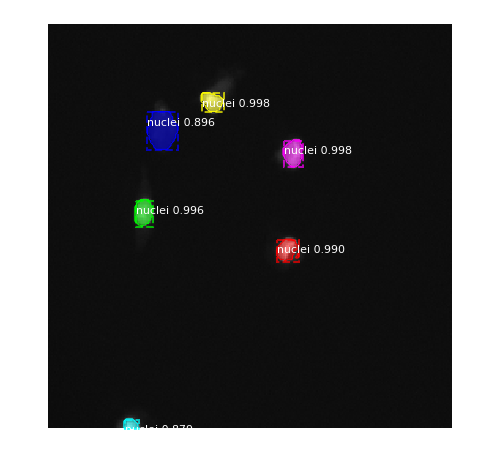

./data/test/336d3e4105766f8ad328a7ee9571e743f376f8cbcf6a969ca7e353fe3235c523/images/336d3e4105766f8ad328a7ee9571e743f376f8cbcf6a969ca7e353fe3235c523.png
Processing 1 images
image                    shape: (519, 253, 3)         min:   11.00000  max:  211.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  107.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


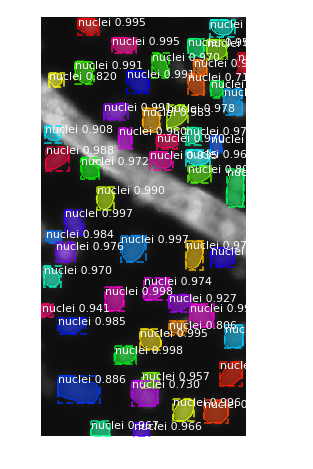

./data/test/38f5cfb55fc8b048e82a5c895b25fefae7a70c71ab9990c535d1030637bf6a1f/images/38f5cfb55fc8b048e82a5c895b25fefae7a70c71ab9990c535d1030637bf6a1f.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  101.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:   -3.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


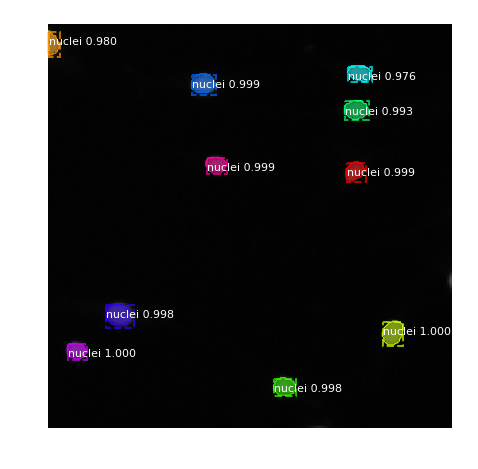

./data/test/3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26/images/3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26.png
Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


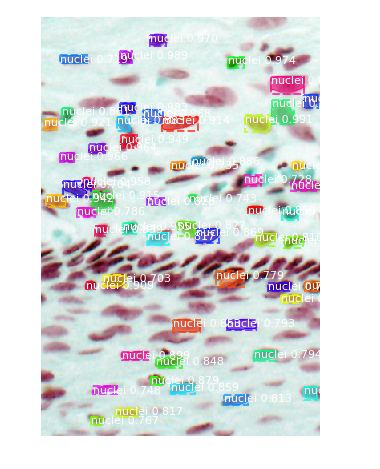

./data/test/432f367a4c5b5674de2e2977744d10289a064e5704b21af6607b4975be47c580/images/432f367a4c5b5674de2e2977744d10289a064e5704b21af6607b4975be47c580.png
Processing 1 images
image                    shape: (520, 348, 3)         min:    5.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


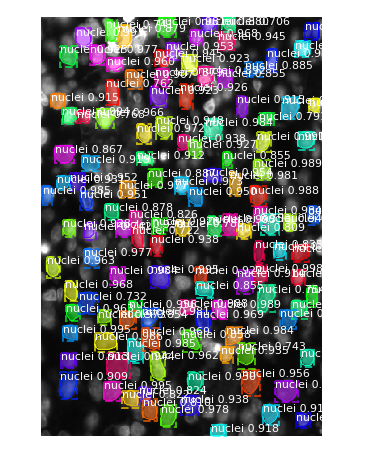

./data/test/43a71aeb641faa18742cb826772a8566c6c947d7050f9ab15459de6cc2b3b6af/images/43a71aeb641faa18742cb826772a8566c6c947d7050f9ab15459de6cc2b3b6af.png
Processing 1 images
image                    shape: (260, 347, 3)         min:    2.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


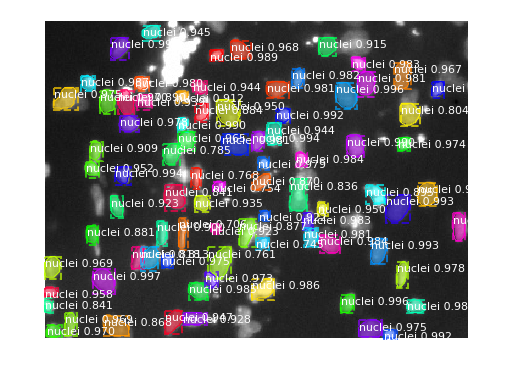

./data/test/44afae184c89e6ba55985b4d341acc1ae1e8b6ef96312064e0e6e630e022b078/images/44afae184c89e6ba55985b4d341acc1ae1e8b6ef96312064e0e6e630e022b078.png
Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


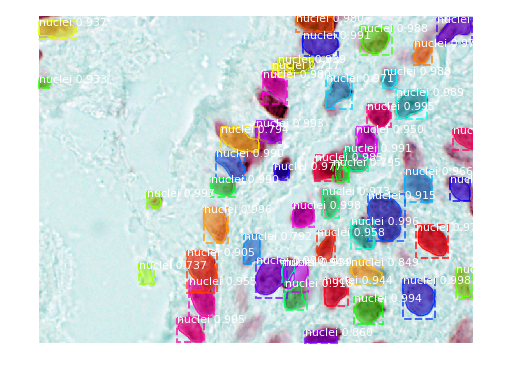

./data/test/4727d94c6a57ed484270fdd8bbc6e3d5f2f15d5476794a4e37a40f2309a091e2/images/4727d94c6a57ed484270fdd8bbc6e3d5f2f15d5476794a4e37a40f2309a091e2.png
Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -112.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


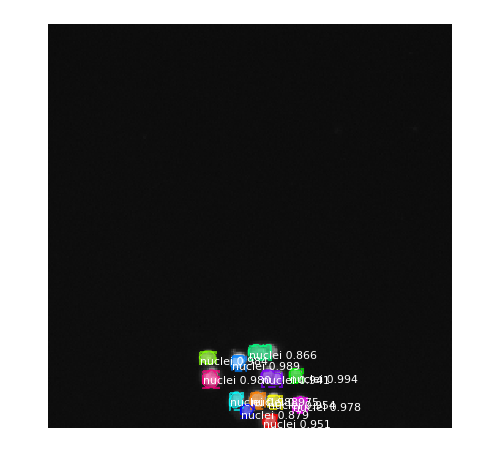

./data/test/472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71/images/472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71.png
Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


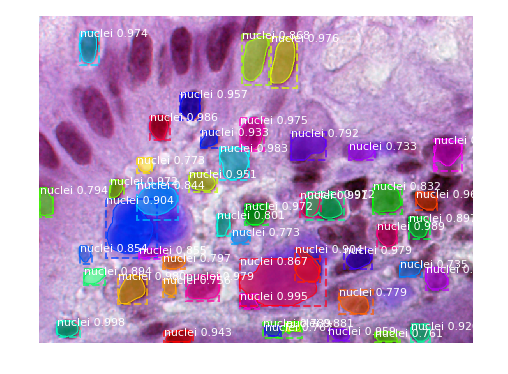

./data/test/4be73d68f433869188fe5e7f09c7f681ed51003da6aa5d19ce368726d8e271ee/images/4be73d68f433869188fe5e7f09c7f681ed51003da6aa5d19ce368726d8e271ee.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


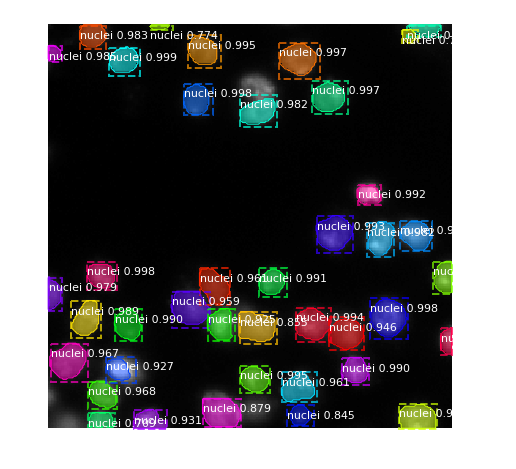

./data/test/4f949bd8d914bbfa06f40d6a0e2b5b75c38bf53dbcbafc48c97f105bee4f8fac/images/4f949bd8d914bbfa06f40d6a0e2b5b75c38bf53dbcbafc48c97f105bee4f8fac.png
Processing 1 images
image                    shape: (390, 239, 3)         min:    0.00000  max:   81.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  -25.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


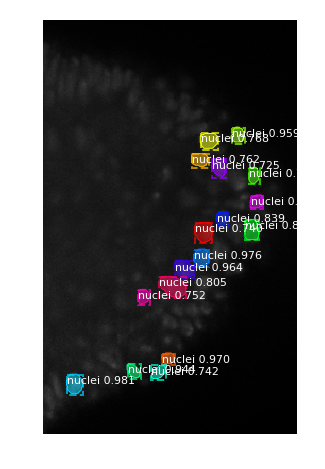

./data/test/505bc0a3928d8aef5ce441c5a611fdd32e1e8eccdc15cc3a52b88030acb50f81/images/505bc0a3928d8aef5ce441c5a611fdd32e1e8eccdc15cc3a52b88030acb50f81.png
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  109.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   -6.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


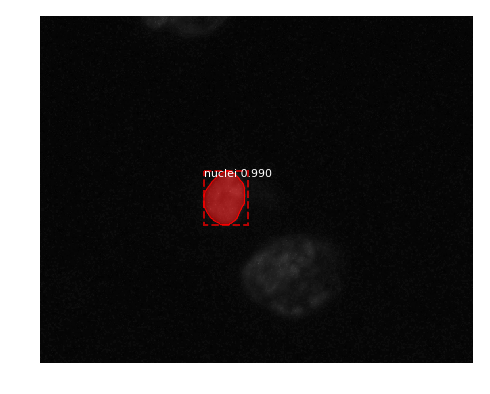

./data/test/519dc0d672d1c295fc69b629af8721ccb1a1f136d1976685a68487e62547ffe0/images/519dc0d672d1c295fc69b629af8721ccb1a1f136d1976685a68487e62547ffe0.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:  121.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:   17.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


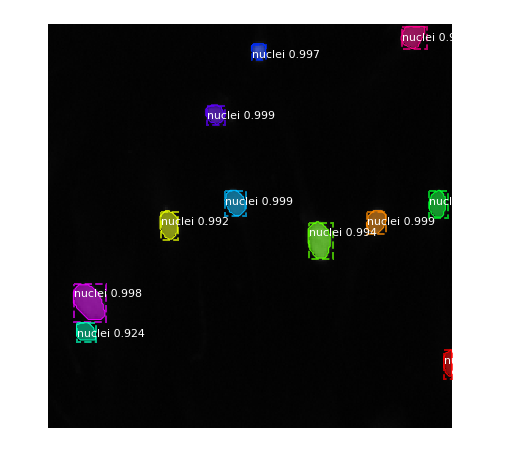

./data/test/51c70bb8a299943b27f8b354571272692d8f2705036a1a9562156c76da5f025b/images/51c70bb8a299943b27f8b354571272692d8f2705036a1a9562156c76da5f025b.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


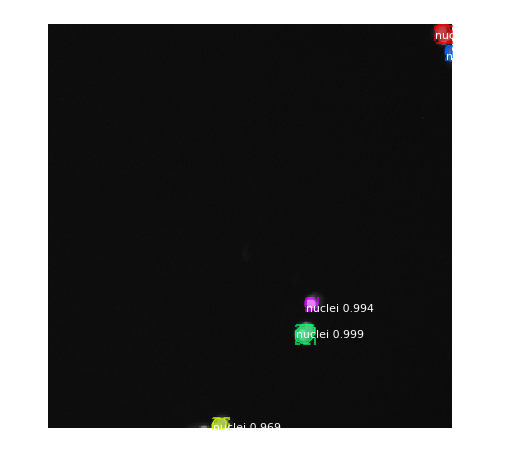

./data/test/52b267e20519174e3ce1e1994b5d677804b16bc670aa5f6ffb6344a0fdf63fde/images/52b267e20519174e3ce1e1994b5d677804b16bc670aa5f6ffb6344a0fdf63fde.png
Processing 1 images
image                    shape: (260, 347, 3)         min:   26.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


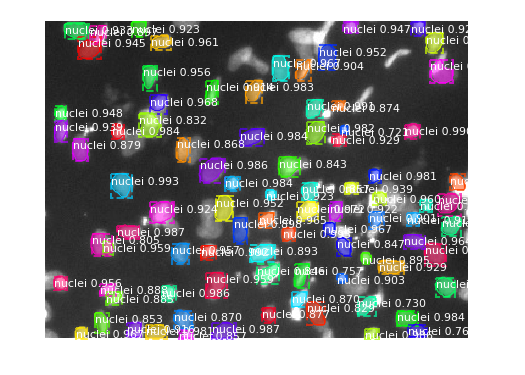

./data/test/53df5150ee56253fe5bc91a9230d377bb21f1300f443ba45a758bcb01a15c0e4/images/53df5150ee56253fe5bc91a9230d377bb21f1300f443ba45a758bcb01a15c0e4.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   93.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:  -11.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


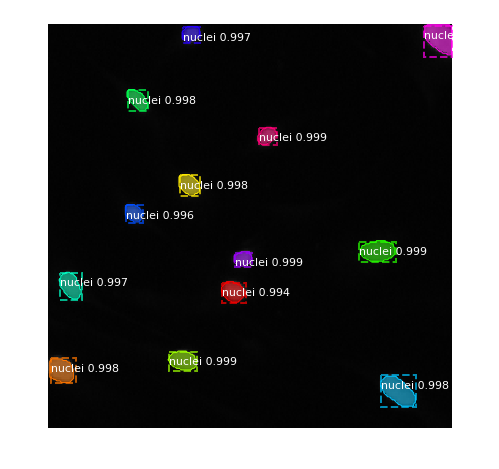

./data/test/550450e4bff4036fd671decdc5d42fec23578198d6a2fd79179c4368b9d6da18/images/550450e4bff4036fd671decdc5d42fec23578198d6a2fd79179c4368b9d6da18.png
Processing 1 images
image                    shape: (520, 348, 3)         min:    3.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


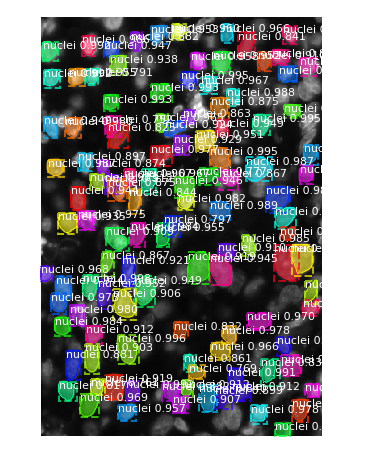

./data/test/5cee644e5ffbef1ba021c7f389b33bafd3b1841f04d3edd7922d5084c2c4e0c7/images/5cee644e5ffbef1ba021c7f389b33bafd3b1841f04d3edd7922d5084c2c4e0c7.png
Processing 1 images
image                    shape: (512, 640, 3)         min:    1.00000  max:  153.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   34.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


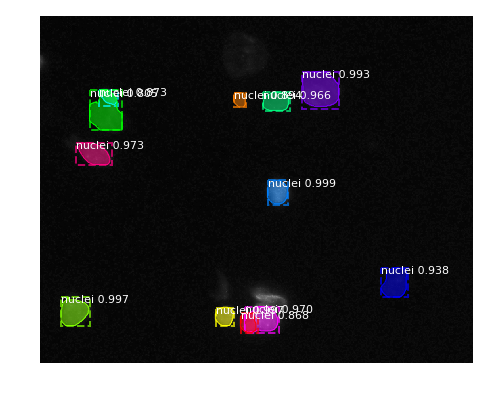

./data/test/648c8ffa496e1716017906d0bf135debfc93386ae86aa3d4adbda9a505985fd9/images/648c8ffa496e1716017906d0bf135debfc93386ae86aa3d4adbda9a505985fd9.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


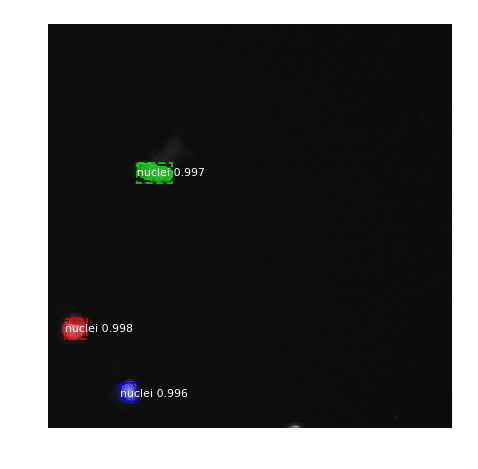

./data/test/697a05c6fe4a07c601d46da80885645ad574ea19b47ee795ccff216c9f1f1808/images/697a05c6fe4a07c601d46da80885645ad574ea19b47ee795ccff216c9f1f1808.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


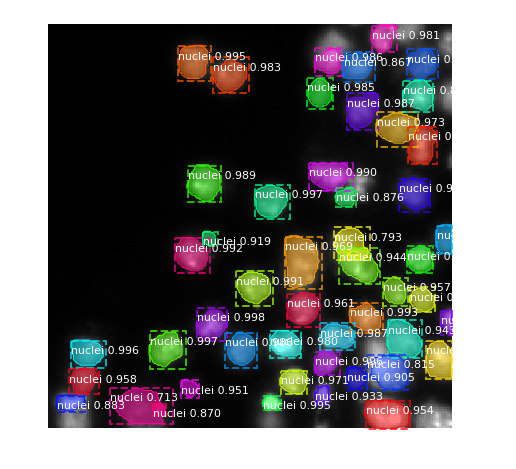

./data/test/699f2992cd71e2e28cf45f81347ff22e76b37541ce88087742884cd0e9aadc68/images/699f2992cd71e2e28cf45f81347ff22e76b37541ce88087742884cd0e9aadc68.png
Processing 1 images
image                    shape: (260, 347, 3)         min:   28.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


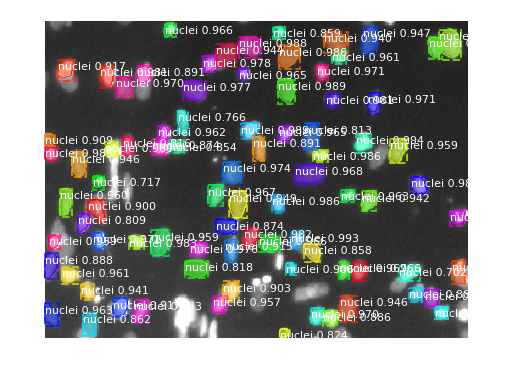

./data/test/78a981bd27ba0c65a9169548665a17bda9f49050d0d3893a6567d1eb92cd003d/images/78a981bd27ba0c65a9169548665a17bda9f49050d0d3893a6567d1eb92cd003d.png
Processing 1 images
image                    shape: (520, 348, 3)         min:    3.00000  max:  186.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   81.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


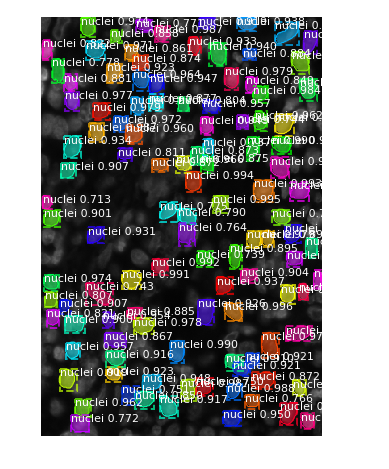

./data/test/7bdb668e6127b7eafc837a883f0648002bd063c736f55a4f673e787250a3fb04/images/7bdb668e6127b7eafc837a883f0648002bd063c736f55a4f673e787250a3fb04.png
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  177.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   47.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


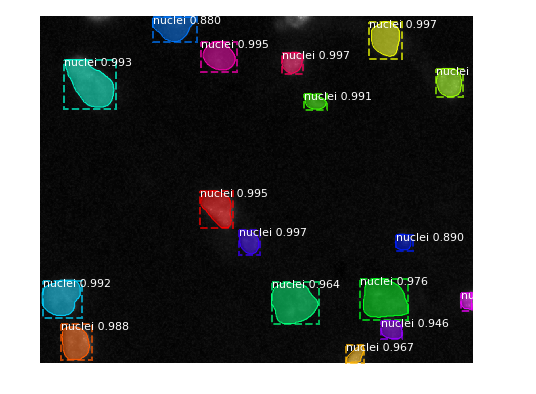

./data/test/7f4cbe0b36b5d09466476a7d4e01f4f976c67872d549f4ff47b3e1e3a2b403af/images/7f4cbe0b36b5d09466476a7d4e01f4f976c67872d549f4ff47b3e1e3a2b403af.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  245.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  136.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


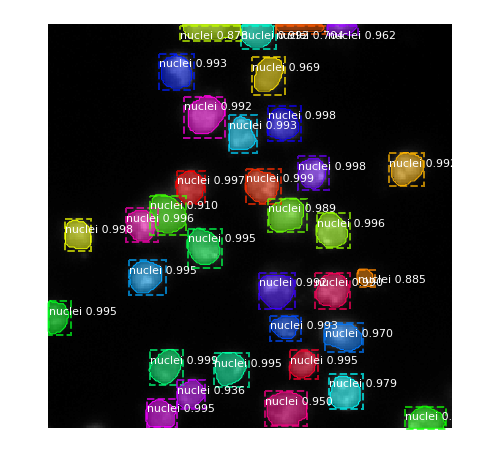

./data/test/8922a6ac8fd0258ec27738ca101867169b20d90a60fc84f93df77acd5bf7c80b/images/8922a6ac8fd0258ec27738ca101867169b20d90a60fc84f93df77acd5bf7c80b.png
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  186.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   71.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


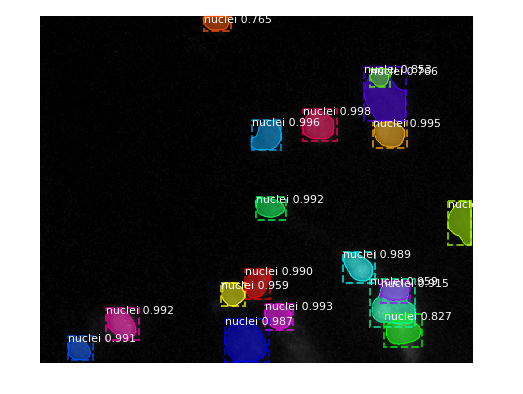

./data/test/8b59819fbc92eefe45b1db95c0cc3a467ddcfc755684c7f2ba2f6ccb9ad740ab/images/8b59819fbc92eefe45b1db95c0cc3a467ddcfc755684c7f2ba2f6ccb9ad740ab.png
Processing 1 images
image                    shape: (520, 696, 3)         min:   10.00000  max:  237.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  133.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


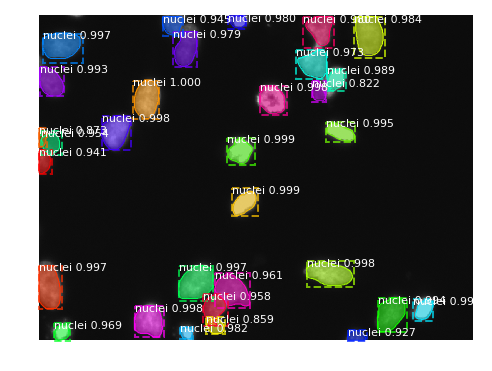

./data/test/912a679e4b9b1d1a75170254fd675b8c24b664d80ad7ea7e460241a23535a406/images/912a679e4b9b1d1a75170254fd675b8c24b664d80ad7ea7e460241a23535a406.png
Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -112.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


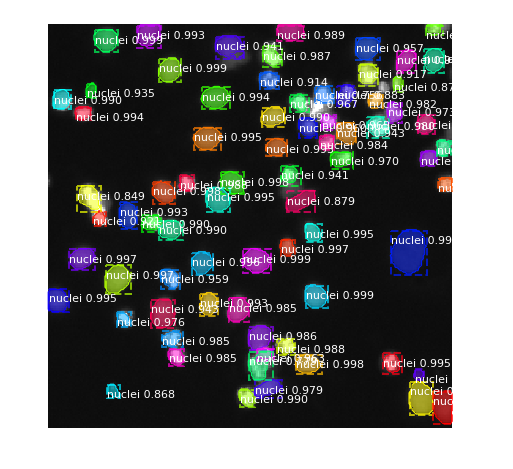

./data/test/9ab2d381f90b485a68b82bc07f94397a0373e3215ad20935a958738e55f3cfc2/images/9ab2d381f90b485a68b82bc07f94397a0373e3215ad20935a958738e55f3cfc2.png
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  109.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   -8.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


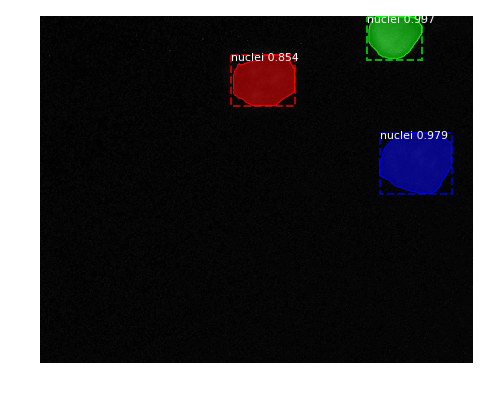

./data/test/9f17aea854db13015d19b34cb2022cfdeda44133323fcd6bb3545f7b9404d8ab/images/9f17aea854db13015d19b34cb2022cfdeda44133323fcd6bb3545f7b9404d8ab.png
Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


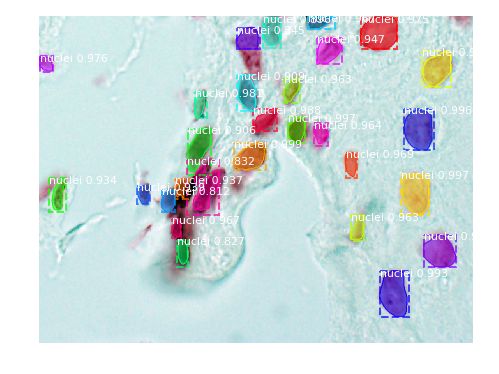

./data/test/a4816cc1fb76cb3c5e481186833fc0ae9cf426a1406a2607e974e65e9cddba4f/images/a4816cc1fb76cb3c5e481186833fc0ae9cf426a1406a2607e974e65e9cddba4f.png
Processing 1 images
image                    shape: (519, 253, 3)         min:    9.00000  max:  101.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   -5.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


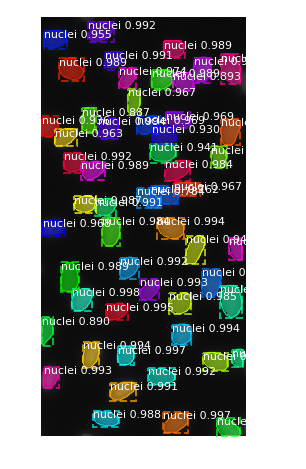

./data/test/a984e7fb886aa02e29d112766d3ce26a4f78eac540ce7bbdbd42af2761928f6d/images/a984e7fb886aa02e29d112766d3ce26a4f78eac540ce7bbdbd42af2761928f6d.png
Processing 1 images
image                    shape: (519, 161, 3)         min:    5.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


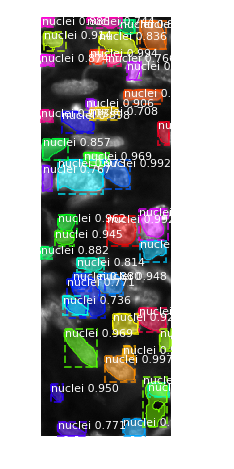

./data/test/ab298b962a63e4be9582513aaa84a5e270adba5fd2b16a50e59540524f63c3b8/images/ab298b962a63e4be9582513aaa84a5e270adba5fd2b16a50e59540524f63c3b8.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:   89.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  -15.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


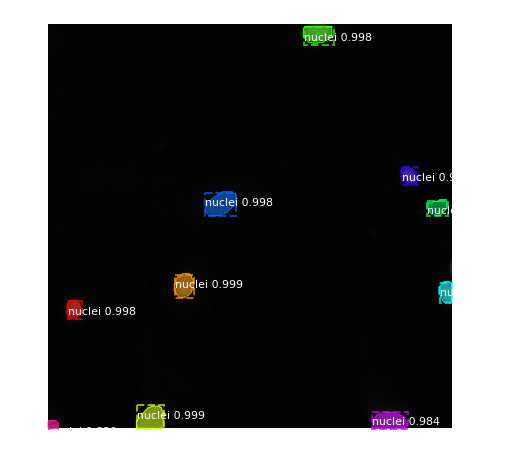

./data/test/ade080c6618cbbb0a25680cf847f312b5e19b22bfe1cafec0436987ebe5b1e7e/images/ade080c6618cbbb0a25680cf847f312b5e19b22bfe1cafec0436987ebe5b1e7e.png
Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  225.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  120.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


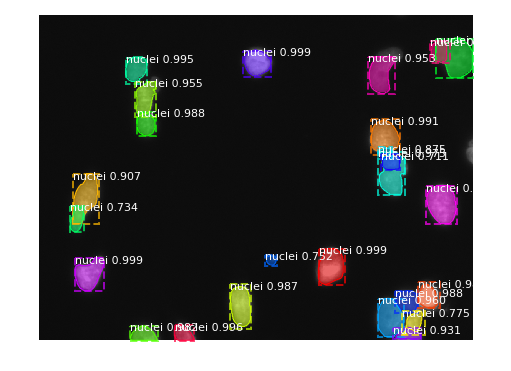

./data/test/b83d1d77935b6cfd44105b54600ffc4b6bd82de57dec65571bcb117fa8398ba3/images/b83d1d77935b6cfd44105b54600ffc4b6bd82de57dec65571bcb117fa8398ba3.png
Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  253.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  146.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


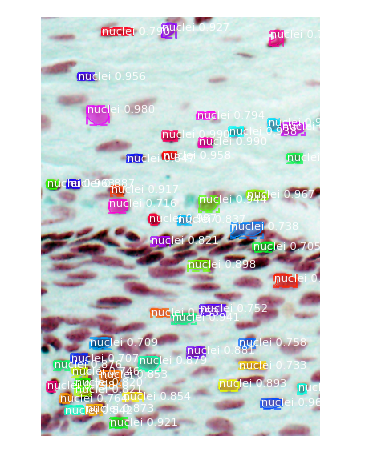

./data/test/bdc789019cee8ddfae20d5f769299993b4b330b2d38d1218646cf89e77fbbd4d/images/bdc789019cee8ddfae20d5f769299993b4b330b2d38d1218646cf89e77fbbd4d.png
Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  230.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  126.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


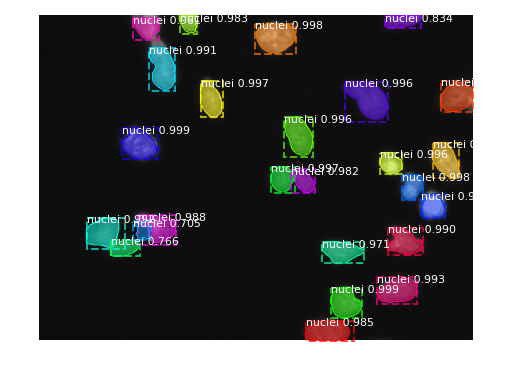

./data/test/c8e79ff4ac55f4b772057de28e539727b7f4f2a3de73bf7a082a0ace86d609eb/images/c8e79ff4ac55f4b772057de28e539727b7f4f2a3de73bf7a082a0ace86d609eb.png
Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  150.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


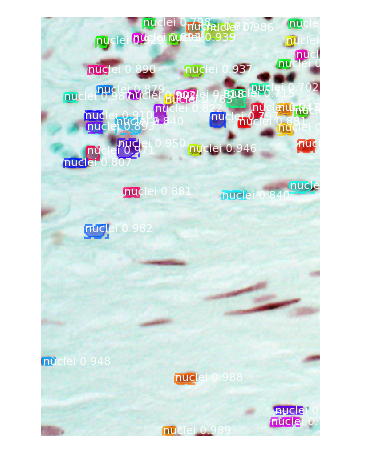

./data/test/ca20076870e8fb604e61802605a9ac45419c82dd3e23404c56c4869f9502a5ef/images/ca20076870e8fb604e61802605a9ac45419c82dd3e23404c56c4869f9502a5ef.png
Processing 1 images
image                    shape: (519, 161, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


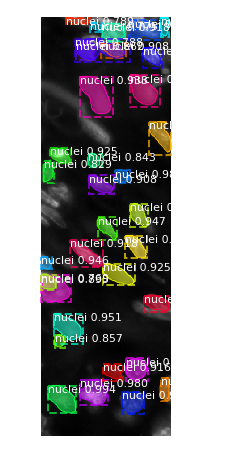

./data/test/d616d323a9eeb9da1b66f8d5df671d63c092c9919cb2c0b223e29c63257c944d/images/d616d323a9eeb9da1b66f8d5df671d63c092c9919cb2c0b223e29c63257c944d.png
Processing 1 images
image                    shape: (519, 162, 3)         min:    3.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


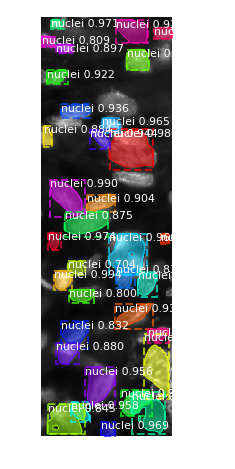

./data/test/d6eb7ce7723e2f6dc13b90b41a29ded27dbd815bad633fdf582447c686018896/images/d6eb7ce7723e2f6dc13b90b41a29ded27dbd815bad633fdf582447c686018896.png
Processing 1 images
image                    shape: (520, 348, 3)         min:    0.00000  max:  201.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   91.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


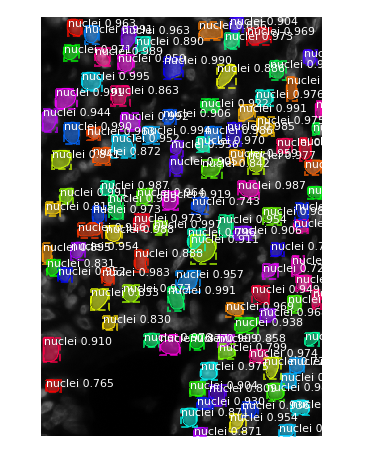

./data/test/d8d4bf68a76e4e4c5f21de7ac613451f7115a04db686151e78b8ec0b6a22022b/images/d8d4bf68a76e4e4c5f21de7ac613451f7115a04db686151e78b8ec0b6a22022b.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    8.00000  max:  192.00000
molded_images            shape: (1, 512, 512, 3)      min: -114.70000  max:   83.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


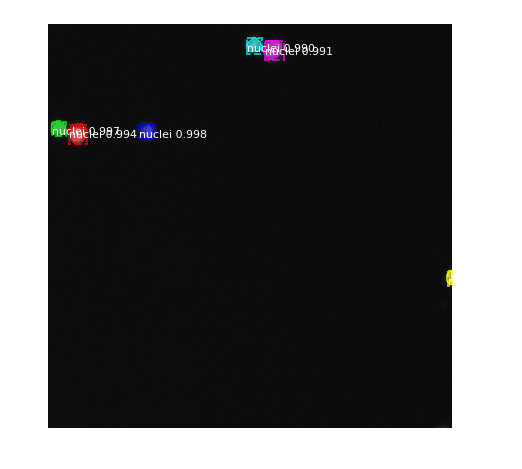

./data/test/da6c593410340b19bb212b9f6d274f95b08c0fc8f2570cd66bc5ed42c560acab/images/da6c593410340b19bb212b9f6d274f95b08c0fc8f2570cd66bc5ed42c560acab.png
Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


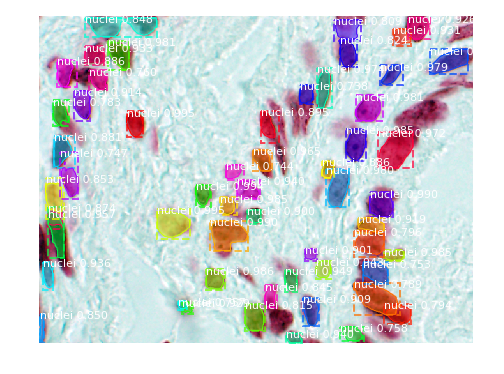

./data/test/dab46d798d29aff2e99c23f47ed3064f5cafb1644629b015c95a2dd2ee593bb4/images/dab46d798d29aff2e99c23f47ed3064f5cafb1644629b015c95a2dd2ee593bb4.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   95.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:   -9.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


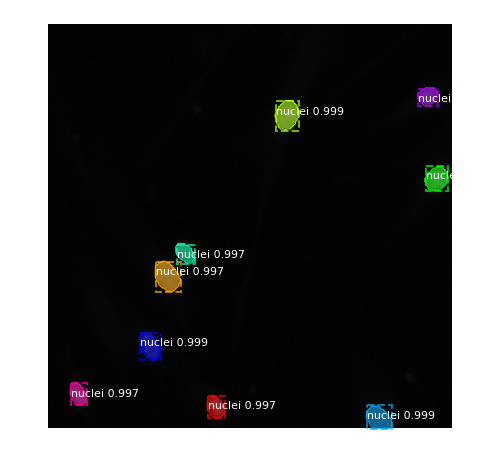

./data/test/df40099c6306ca1f47fcc8a62e2fa39486d4e223177afdc51b2ad189691802d8/images/df40099c6306ca1f47fcc8a62e2fa39486d4e223177afdc51b2ad189691802d8.png
Processing 1 images
image                    shape: (260, 347, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


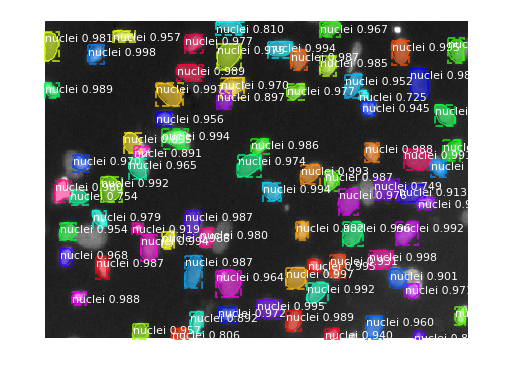

./data/test/e17b7aedd251a016c01ef9158e6e4aa940d9f1b35942d86028dc1222192a9258/images/e17b7aedd251a016c01ef9158e6e4aa940d9f1b35942d86028dc1222192a9258.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   82.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:  -22.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


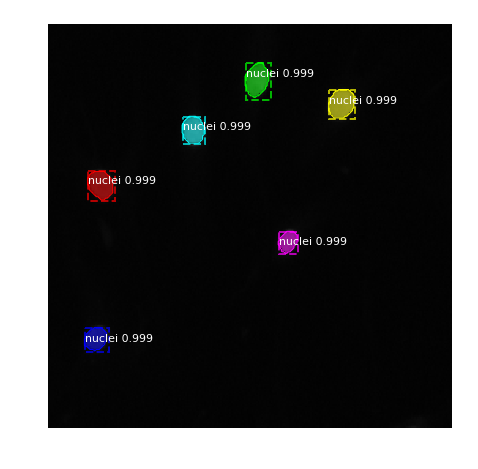

./data/test/eea70a7948d25a9a791dbcb39228af4ea4049fe5ebdee9c04884be8cca3da835/images/eea70a7948d25a9a791dbcb39228af4ea4049fe5ebdee9c04884be8cca3da835.png
Processing 1 images
image                    shape: (519, 253, 3)         min:   10.00000  max:  225.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  120.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


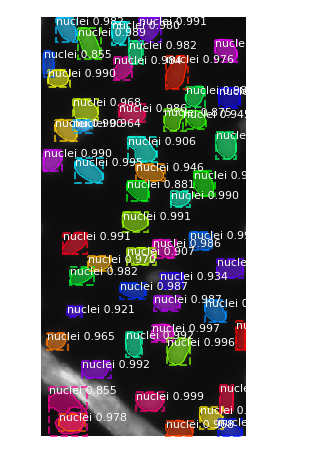

./data/test/f0d0ab13ff53adc3c4d57e95a5f83d80b06f2cbc0bf002b52cf7b496612e0ce4/images/f0d0ab13ff53adc3c4d57e95a5f83d80b06f2cbc0bf002b52cf7b496612e0ce4.png
Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  222.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  117.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


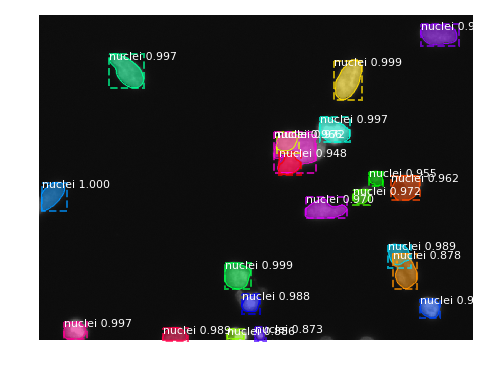

./data/test/f5effed21f671bbf4551ecebb7fe95f3be1cf09c16a60afe64d2f0b95be9d1eb/images/f5effed21f671bbf4551ecebb7fe95f3be1cf09c16a60afe64d2f0b95be9d1eb.png
Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


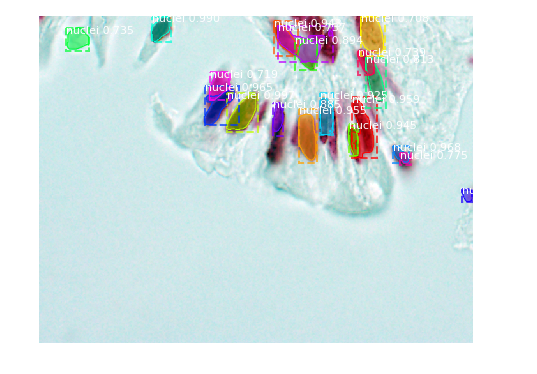

./data/test/fac507fa4d1649e8b24c195d990f1fc3ca3633d917839e1751a9d412a14ab5e3/images/fac507fa4d1649e8b24c195d990f1fc3ca3633d917839e1751a9d412a14ab5e3.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


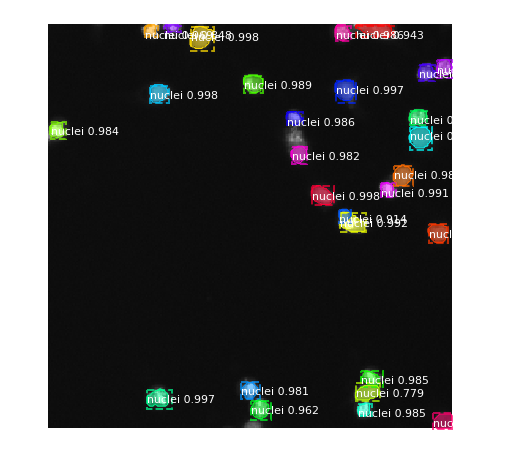

./data/test/fe9adb627a6f45747c5a8223b671774791ededf9364f6544be487c540107fa4f/images/fe9adb627a6f45747c5a8223b671774791ededf9364f6544be487c540107fa4f.png
Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


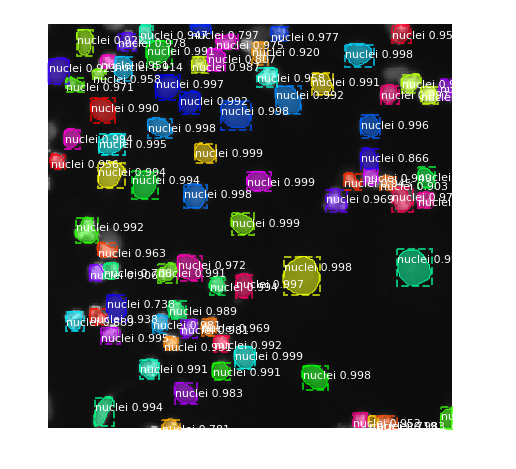

In [26]:
output = []

for image_id in sample_submission.ImageId:
    image_path = os.path.join(TEST_DIR, image_id, 'images', image_id + '.png')
    print (image_path)
    
    original_image = cv2.imread(image_path)
    results = model.detect([original_image], verbose=1)
    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                ['', 'nuclei'], r['scores'], ax=get_ax())